# Consistency models for Stable Diffusion 1.5

In this project we try to accelerate inference for Stable Diffusion 1.5 "text to image" model. SD1.5 consists of the following parts:
1) **VAE** - converts $3{\times}512{\times}512$ images into $4{\times}64{\times}64$ latents and back.
2) **Text encoder** - makes prompt embeddings
3) **Diffusional model** - UNet that generates latents from text embeddings

Initially, we demonstrate that it makes nice images in 50 steps, but unacceptable images in 4 steps. We use 3 slightly different approaches to train models that make acceptable images in just 4 steps. For that we demonstrate 3 approaches:
1) **Consistency training** - teaching the model to make larger steps along the diffusional denoising trajectory by calculating loss between results (one-step-denoised images) before and after the large step.
2) **Consistency distillation** - same as above, but with using a "teacher" model with classifier-free guidance to make that large step.
3) **Multi-boundary consistency distillation** - same as above, but those with those "results" being images denoised to the nearest boundary instead of completely denoised.

We train our models on a part of COCO dataset. We use the following techniques to reduce time and memory usage and fit into free Google Colab and Kaggle GPUs:
1) Low-rank trainable adapters (LoRA) from PEFT library to certrain layers of the initial model while freezing the rest of the model
2) gradient checkpointing
3) gradient accumulation
4) mixed precision approach (we train in FP32 and run inference and "teacher" models in FP16)

And in the end we get we produce very acceptable images in just 4 steps.

This project was created as a part of my training during "CV week" course from Yandex (Школа анализа данных, ШАД).

In [1]:
# this gets the training dataset
!wget https://storage.yandexcloud.net/yandex-research/train2014_5k.tar.gz
!tar -xzf train2014_5k.tar.gz

--2024-12-19 21:08:56--  https://storage.yandexcloud.net/yandex-research/train2014_5k.tar.gz
Resolving storage.yandexcloud.net (storage.yandexcloud.net)... 213.180.193.243, 2a02:6b8::1d9
Connecting to storage.yandexcloud.net (storage.yandexcloud.net)|213.180.193.243|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 818380970 (780M) [application/x-tar]
Saving to: ‘train2014_5k.tar.gz’

train2014_5k.tar.gz 100%[===================>] 780.47M  54.8MB/s    in 14s     

2024-12-19 21:09:11 (53.9 MB/s) - ‘train2014_5k.tar.gz’ saved [818380970/818380970]



In [2]:
!pip install huggingface_hub
!pip install diffusers
!pip install peft

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 56.8 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 374.8/374.8 kB 12.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 450.5/450.5 kB 26.5 MB/s eta 0:00:00
  Attempting uninstall: huggingface-hub
    Found existing installation: huggingface-hub 0.24.7
    Uninstalling huggingface-hub-0.24.7:
      Successfully uninstalled huggingface-hub-0.24.7


In [3]:
from tqdm.auto import tqdm

import csv
import os
import torch
from torchvision import transforms
from PIL import Image
from diffusers import StableDiffusionPipeline, UNet2DConditionModel, DDIMScheduler

from peft import LoraConfig, get_peft_model

%matplotlib inline
import matplotlib.pyplot as plt

import functools

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [4]:
#---------------------
# Visualization utils
#---------------------

def visualize_images(images):
    assert len(images) == 4
    plt.figure(figsize=(12, 3))
    for i, image in enumerate(images):
        plt.subplot(1, 4, i+1)
        plt.imshow(image)
        plt.axis('off')

    plt.subplots_adjust(wspace=-0.01, hspace=-0.01)


#--------------
# Tensor utils
#--------------

def extract_into_tensor(a, t, x_shape):
    b, *_ = t.shape
    out = a.gather(-1, t)
    return out.reshape(b, *((1,) * (len(x_shape) - 1)))

#---------------
# Dataset utils
#---------------

class COCODataset(torch.utils.data.Dataset):
    def __init__(self, root_dir, subset_name="train2014_5k", transform=None, max_cnt=None):
        """
        Arguments:
            root_dir (string): Directory with all the images.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        self.root_dir = root_dir
        self.transform = transform
        self.extensions = (
            ".jpg",
            ".jpeg",
            ".png",
            ".ppm",
            ".bmp",
            ".pgm",
            ".tif",
            ".tiff",
            ".webp",
        )
        sample_dir = os.path.join(root_dir, subset_name)

        # Collect sample paths
        self.samples = sorted(
            [
                os.path.join(sample_dir, fname)
                for fname in os.listdir(sample_dir)
                if fname[-4:] in self.extensions
            ],
            key=lambda x: x.split("/")[-1].split(".")[0],
        )
        self.samples = (
            self.samples if max_cnt is None else self.samples[:max_cnt]
        )  # restrict num samples

        # Collect captions
        self.captions = {}
        with open(
            os.path.join(root_dir, f"{subset_name}.csv"), newline="\n"
        ) as csvfile:
            spamreader = csv.reader(csvfile, delimiter=",")
            for i, row in enumerate(spamreader):
                if i == 0:
                    continue
                self.captions[row[1]] = row[2]

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        sample_path = self.samples[idx]
        sample = Image.open(sample_path).convert("RGB")

        if self.transform:
            sample = self.transform(sample)

        return {
            "image": sample,
            "text": self.captions[os.path.basename(sample_path)],
            "idxs": idx, }

# Teacher model ([StableDiffusion 1.5](https://huggingface.co/stable-diffusion-v1-5/stable-diffusion-v1-5))

In [5]:
pipe = StableDiffusionPipeline.from_pretrained(
    "sd-legacy/stable-diffusion-v1-5",
    variant="fp16",
    torch_dtype=torch.float16, # precision
    device_map="balanced" # load model directly on GPU
)

# check that everything is in FP16 and on cuda
assert pipe.unet.dtype == torch.float16 and pipe.unet.device.type == 'cuda'
assert pipe.vae.dtype == torch.float16 and pipe.vae.device.type == 'cuda'
assert pipe.text_encoder.dtype == torch.float16 and pipe.text_encoder.device.type == 'cuda'

# put up a DDIM scheduler
pipe.scheduler = DDIMScheduler.from_config(pipe.scheduler.config, timestep_spacing="trailing")
pipe.scheduler.timesteps = pipe.scheduler.timesteps.cuda()
pipe.scheduler.alphas_cumprod = pipe.scheduler.alphas_cumprod.cuda()

# this will be our teacher model
teacher_unet = pipe.unet

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/608M [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


Teacher model generates beautiful images like those, but it takes 50 steps

  0%|          | 0/50 [00:00<?, ?it/s]

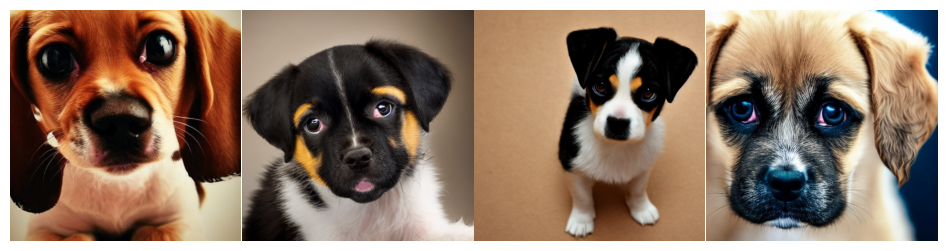

In [ ]:
prompt = "A sad puppy with large eyes"
num_inference_steps = 50
guidance_scale = 7.5
num_images_per_prompt = 4
generator = torch.Generator('cuda').manual_seed(1)

# MY CODE
images = pipe(
          [prompt],
          generator=generator,
          num_inference_steps = num_inference_steps,
          guidance_scale = guidance_scale,
          num_images_per_prompt = num_images_per_prompt
          ).images
#images = <YOUR CODE HERE>

visualize_images(images)

And images generated in just 4 steps are clearly unacceptable:

  0%|          | 0/4 [00:00<?, ?it/s]

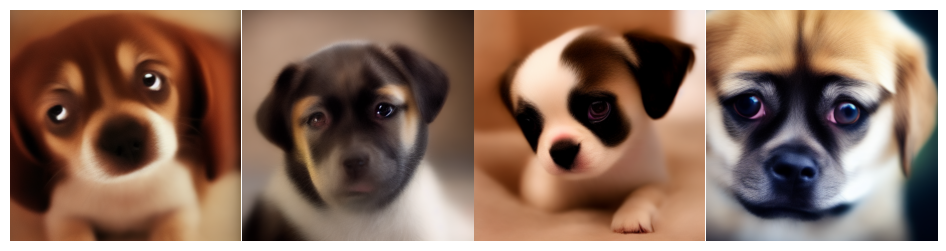

In [7]:
prompt = "A sad puppy with large eyes"
num_inference_steps = 4
guidance_scale = 7.5
num_images_per_prompt = 4
generator = torch.Generator('cuda').manual_seed(1)

# MY CODE
images = pipe(
          [prompt],
          generator=generator,
          num_inference_steps = num_inference_steps,
          guidance_scale = guidance_scale,
          num_images_per_prompt = num_images_per_prompt
          ).images
#images = <YOUR CODE HERE>

visualize_images(images)

So the goal of this project is to train models that can make nice images in those 4 steps

##  Preparing dataset

Here we can use 5000 images from the COCO dataset. In fact, just 500-1000 images is already enough to obtain acceptable quality that clearly surpasses the images above.

Commands below bring the data that consists of images and text prompts

In [8]:
#!wget https://storage.yandexcloud.net/yandex-research/train2014_5k.tar.gz
#!tar -xzf train2014_5k.tar.gz

In [9]:
transform = transforms.Compose(
    [
        transforms.Resize(512),
        transforms.CenterCrop(512),
        transforms.ToTensor(),
        lambda x: 2 * x - 1,
    ]
)
dataset = COCODataset(".",
    subset_name="train2014_5k",
    transform=transform,
    max_cnt=3000
)

batch_size = 4  # This is what fits in free 16GB GPUs from Google Colab or Kaggle

train_dataloader = torch.utils.data.DataLoader(
    dataset=dataset, shuffle=True, batch_size=batch_size, drop_last=True
)

In [10]:
@torch.no_grad()
def prepare_batch(batch, pipe):
    #Return:
    #    latents: torch.Tensor([B, 4, 64, 64], dtype=torch.float16)
    #    prompt_embeds: torch.Tensor([B, 77, D], dtype=torch.float16)

    # tokenizing text prompts
    text_inputs = pipe.tokenizer(
        batch['text'],
        padding="max_length",
        max_length=pipe.tokenizer.model_max_length,
        truncation=True,
        return_tensors="pt",
    )

    # creating embeddings for text prompts
    prompt_embeds = pipe.text_encoder(text_inputs.input_ids.cuda())[0]

    # "compressing" images into latent 4x64x64 space with 
    # VAE encoder that is also a part of SD1.5 pipeline
    image = batch['image'].to("cuda", dtype=torch.float16)
    latents = pipe.vae.encode(image).latent_dist.sample()
    latents = latents * pipe.vae.config.scaling_factor
    return latents, prompt_embeds

### Preparing the "student" model

Here we will begin the same UNet model from SD1.5 and finetune it with LoRA technique to reduce the complexity of training task

In [11]:
unet = UNet2DConditionModel.from_pretrained(
        "sd-legacy/stable-diffusion-v1-5",
        subfolder="unet",
        torch_dtype = torch.float32, # it is OK to run inference in FP16, but for training we want FP32
        variant = "fp16",
        device_map="balanced"
    )

unet.training = True

Here we use LoRA technique to finetune the model. LoRA means adding a set of low-rank trainable adapters to certain layers and freezing the rest of the model. This allows to tune complex models with only a limited amount of trainable parameters. This also allows train multiple sets for a single model and effectively turn in into several different models. LoRA slows inference unless we decide to merge the set with the initial model.

In [12]:
# layers to finetune with LoRA
lora_modules = [
    "to_q", "to_k", "to_v", "to_out.0", "proj_in", "proj_out",
    "ff.net.0.proj", "ff.net.2", "conv1", "conv2", "conv_shortcut",
    "downsamplers.0.conv", "upsamplers.0.conv", "time_emb_proj"
]
lora_config = LoraConfig(
    r=64, # LoRA adapters rank
    target_modules=lora_modules
)

# Using PEFT library to create a LoRA wrapped model
cm_unet = get_peft_model(unet, lora_config, adapter_name="ct")

# Use gradient checkpointing to conserve memory
cm_unet.enable_gradient_checkpointing()

optimizer = torch.optim.AdamW(cm_unet.parameters(), lr=0.3e-4)

# Using MSE loss for now, will shift to pseudo-Huber loss later
mse_loss = torch.nn.functional.mse_loss

In [13]:
len(list(cm_unet.parameters()))

1242

The idea of generating images with diffusion is to inital Gauss noise as a partially noised image and denoise it gradually according to a noise scheduler

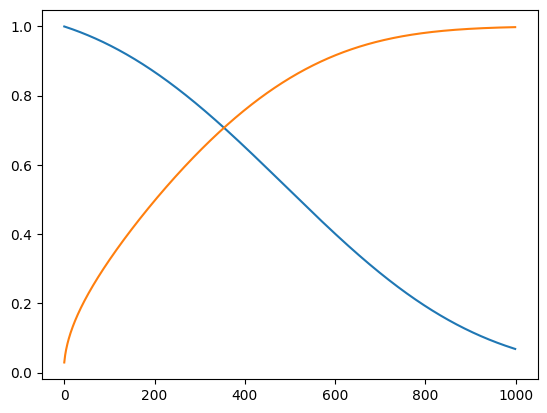

In [14]:
noise_scheduler = DDIMScheduler.from_pretrained(
        "sd-legacy/stable-diffusion-v1-5", subfolder="scheduler",
    )

# this plot demonstrates the schedule of how much image and noise we should have at each stage
plt.plot(noise_scheduler.alphas_cumprod**0.5)
plt.plot( (1-noise_scheduler.alphas_cumprod)**0.5 )

In [15]:
def ddim_solver_step(model_output, x_t, t, s, scheduler):

    # This linear solver makes a step for our [B, 4, 64, 64] batch of latents
    # along the denoising trajectory from points t to points s (which are torch.Tensor[B] vectors)

    alphas = scheduler.alphas_cumprod ** 0.5
    sigmas = (1 - scheduler.alphas_cumprod ) ** 0.5

    sigmas_s = extract_into_tensor(sigmas, s, x_t.shape)
    alphas_s = extract_into_tensor(alphas, s, x_t.shape)

    sigmas_t = extract_into_tensor(sigmas, t, x_t.shape)
    alphas_t = extract_into_tensor(alphas, t, x_t.shape)

    # border conditions: full image an no noise at all in the end
    alphas_s[s == 0] = 1.0
    sigmas_s[s == 0] = 0.0

    alphas_t[t == 0] = 1.0
    sigmas_t[t == 0] = 0.0

    x_0 = (x_t - sigmas_t * model_output) / alphas_t    # this is our current guess for zero noise image   
    x_s = alphas_s * x_0 + sigmas_s * model_output      # we put the noise back for the next step
    return x_s

In [16]:
# an utility function to add random or given noise according to current step
def q_sample(x, t, scheduler, noise=None):
    alphas = scheduler.alphas_cumprod ** 0.5
    sigmas = (1 - scheduler.alphas_cumprod ) ** 0.5

    if noise is None:
        noise = torch.randn_like(x).cuda()

    sigmas_t = extract_into_tensor(sigmas, t, x.shape)
    alphas_t = extract_into_tensor(alphas, t, x.shape)

    alphas_t[t == 0] = 1.0
    sigmas_t[t == 0] = 0.0

    x_t = x * alphas_t  + noise * sigmas_t
    return x_t

# Consistency Training (1st approach)

Our first approach is constistensy training. Here we use the same model as a teacher to teach it to make large denoising steps while staying on the same trajectory in latent space.

The first distillation approach is rather naive. Basically, we predict noise, make a step from point t to point s with less noise. Then we predict the noise again and we want the former prediction to be closer to the latter.

In [17]:
def get_xs_from_xt_naive(
    x_0, x_t, t, s, # some of the arguments are to be used in the other two methods
    scheduler,
    noise=None,
    **kwargs
):
    x_s = q_sample(x_0, s, scheduler, noise=noise)
    return x_s

This loss function with work for all 3 approaches when we substitute the necessary parts

In [18]:
def cm_loss_template(
    latents, prompt_embeds, # a batch of latents and text embeddings
    unet, scheduler,

    # We use the same loss function for all 3 approaches, but we will substitute parts of it
    loss_fn: callable,
    get_boundary_timesteps: callable,
    get_xs_from_xt: callable,

    num_timesteps=1000,
    step_size=20, # We want to teach the model to make steps this large
):
    # we will randomly choose an interval for each image in the batch t ~ U[step_size-1, 999]
    num_intervals = num_timesteps // step_size

    index = torch.randint(1, num_intervals, (len(latents),), device=latents.device).long() # [1, num_intervals]
    t = step_size * index - 1
    s = torch.clamp(t - step_size, min=0)

    # this is for later multi-boundary distillation approach
    # at this stage boundary timestep is always 0
    boundary_timesteps = get_boundary_timesteps(
        s, num_timesteps=num_timesteps
    )

    # initial noise for each image in the batch
    noise = torch.randn_like(latents).cuda()
    x_t = q_sample(latents, t, scheduler, noise=noise)

    # We want to train in fp32 precision, but run inference in fp16
    # predicting noise with the "student model"
    with torch.amp.autocast("cuda", torch.float32):
        noise_pred = unet(x_t.float(), t,
            encoder_hidden_states=prompt_embeds.float(),
        ).sample

    # make the "student" prediction at the boundary from step t
    boundary_pred = ddim_solver_step(noise_pred, x_t, t, boundary_timesteps, scheduler)
    
    # advance to step s with the "student" prediction
    x_s = get_xs_from_xt(
        latents, x_t, t, s,
        scheduler,
        prompt_embeds=prompt_embeds,
        noise=noise,
    )

    # predict noise at step s with the "teacher" model
    with torch.no_grad(), torch.amp.autocast("cuda", torch.float16):
        target_noise_pred = unet(x_s, s, encoder_hidden_states=prompt_embeds).sample

    # make the "teacher" prediciton at step s
    boundary_target = ddim_solver_step(target_noise_pred, x_s, s, boundary_timesteps, scheduler)
    #boundary_target = <YOUR CODE HERE>

    # and calculate the difference
    loss = loss_fn(boundary_pred, boundary_target)
    return loss

In [19]:
# this is a filler function for now to be replaced for the multi-boundary approach
def get_zero_boundary_timesteps(t, **kwargs):
    return torch.zeros_like(t)

# combine the loss function with all of the fillers for the first approach
# which is consistensy distillation or self-training
ct_loss = functools.partial(
    cm_loss_template,
    loss_fn=mse_loss,
    get_boundary_timesteps=get_zero_boundary_timesteps,
    get_xs_from_xt=get_xs_from_xt_naive
)
assert cm_unet.active_adapter == 'ct'

### Train loop

Here we want batch_size = 8, but we can't afford it with free Google Colab or Kaggle GPUs. So we use gradient accumulation to emulate a larger batch.

In [20]:
def train_loop(model, pipe, train_dataloader, optimizer, loss_fn, num_grad_accum=1):
    scaler = torch.amp.GradScaler()
    torch.cuda.empty_cache()

    for i, batch in enumerate(tqdm(train_dataloader)):

        optimizer.zero_grad(set_to_none=True)

        latents, prompt_embeds = prepare_batch(batch, pipe)
        with torch.amp.autocast(device_type='cuda', dtype=torch.float16):
            loss = loss_fn(latents, prompt_embeds, model, pipe.scheduler)
            loss /= num_grad_accum

        scaler.scale(loss).backward()

        # 1 optimizer step per 2 batches
        if (i + 1) % num_grad_accum == 0:
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad()

        #print(f"Loss: {loss.detach().item()}")

In [21]:
num_grad_accum = 2 # 1 optimizer step per 2 batches

train_loop(cm_unet, pipe, train_dataloader, optimizer, ct_loss, num_grad_accum)

  0%|          | 0/750 [00:00<?, ?it/s]

## Inference

We need a sampler to create images from prompts with the new model. We generate latents as N(0,I) noise, and repeat the following:
* predict noise with our model
* remove it from latents
* add less of it according to schedule

Then we make images from latents with VAE decoder that comes in SD1.5 package

In [22]:
@torch.no_grad()
def consistency_sampling(
    pipe,
    prompt,
    num_inference_steps=4,
    generator=None,
    num_images_per_prompt=4,
    guidance_scale=1
):
    # handling an empty prompt or a batch of prompts
    if prompt is not None and isinstance(prompt, str):
        batch_size = 1
    elif prompt is not None and isinstance(prompt, list):
        batch_size = len(prompt)

    device = pipe._execution_device

    do_classifier_free_guidance = guidance_scale > 0
    prompt_embeds, null_prompt_embeds = pipe.encode_prompt(prompt, 
                                                           device, 
                                                           num_images_per_prompt,
                                                           do_classifier_free_guidance,
                                                           negative_prompt=[""])

    # 'trailing' means scheduler values correspond to the "noisy" ends of intervals, not the "clear" ends
    assert pipe.scheduler.config['timestep_spacing'] == 'trailing'
    pipe.scheduler.set_timesteps(num_inference_steps)

    # A batch of latents from N(0,I)
    latents = torch.randn(batch_size*num_images_per_prompt, 4, 64, 64, generator=generator, device=device, dtype=torch.float16)

    for i, t in enumerate(tqdm(pipe.scheduler.timesteps)):
        t = torch.tensor([t] * len(latents)).to(device)
        zero_t = torch.tensor([0] * len(latents)).to(device)

        cond_noise_pred = pipe.unet(latents, t,
                                    encoder_hidden_states=prompt_embeds
                                    ).sample
        
        if do_classifier_free_guidance:
            uncond_noise_pred = pipe.unet(latents, t,
                                    encoder_hidden_states=null_prompt_embeds
                                    ).sample
            noise_pred = uncond_noise_pred + guidance_scale*(cond_noise_pred - uncond_noise_pred)
        else:
            noise_pred = cond_noise_pred

        # removing the noise we've just predicted
        x_0 = ddim_solver_step(noise_pred, latents, t, zero_t, pipe.scheduler)

        if i + 1 < num_inference_steps:
            # and then adding less noise according to the schedule
            s = pipe.scheduler.timesteps[i+1]
            s = torch.tensor([s] * len(latents)).to(device)
            latents = q_sample(x_0, s, pipe.scheduler, noise=noise_pred)
        else:
            # unless it's the last step
            latents = x_0

        latents = latents.half()

    image = pipe.vae.decode(latents / pipe.vae.config.scaling_factor, return_dict=False)[0]
    do_denormalize = [True] * image.shape[0]
    image = pipe.image_processor.postprocess(image, output_type="pil", do_denormalize=do_denormalize)
    return image

  0%|          | 0/4 [00:00<?, ?it/s]

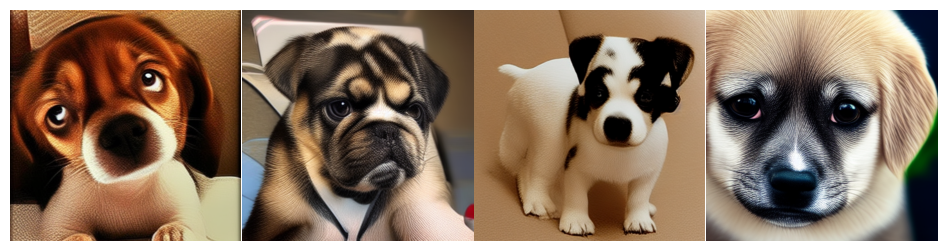

In [23]:
pipe.unet = cm_unet.eval().to(torch.float16)
assert cm_unet.active_adapter == 'ct'

prompt = "A sad puppy with large eyes"
generator = torch.Generator(device="cuda").manual_seed(1)
guidance_scale = 3
num_inference_steps = 4

images = consistency_sampling(
    pipe,
    [prompt],
    num_inference_steps=4,
    generator=generator,
    num_images_per_prompt=4,
    guidance_scale=guidance_scale
)

visualize_images(images)

generated images arent great, but are much clearer than what pure SD1.5 gives in 4 steps

# Consistency Distillation (2nd approach)

In this approach we use a "teacher" model to make a step from point t to point s. We also use classifier-free guidance (CFG) with our "teacher" model to teach the "student" to stay on guided trajectories in latent space.

In [24]:
unet = unet.to(torch.float32)
unet.train()
assert unet.dtype == torch.float32

# Making a separate set of LoRA adapters for the new model
cm_unet.add_adapter("cd", lora_config)
cm_unet.set_adapter("cd")

optimizer = torch.optim.AdamW(cm_unet.parameters(), lr=0.3e-4)

In [25]:
@torch.no_grad()
def get_xs_from_xt_with_teacher(
    x_0, x_t, t, s, # using different values from what we've been using in constency training
    scheduler,
    prompt_embeds,
    teacher_unet,
    guidance_scale,
    **kwargs
):
    
    # making predictions with prompt_embeds
    with torch.no_grad(), torch.amp.autocast("cuda", torch.float16):
        cond_noise_pred = teacher_unet(x_t, t, encoder_hidden_states=prompt_embeds).sample
    
    uncond_input_ids = pipe.tokenizer(
        [""], return_tensors="pt", padding="max_length", max_length=77
    ).input_ids.to("cuda")

    uncond_prompt_embeds = pipe.text_encoder(uncond_input_ids)[0].expand(
        *prompt_embeds.shape
    )

    # and with embeddings for an empty prompt for classifier-free guidance
    with torch.no_grad(), torch.amp.autocast("cuda", torch.float16):
        uncond_noise_pred = teacher_unet(x_t, t, encoder_hidden_states=uncond_prompt_embeds).sample

    noise_pred = uncond_noise_pred + guidance_scale*(cond_noise_pred - uncond_noise_pred)

    # instead of making x_s from x_0
    # now making it directly from x_t with the "teacher" model
    x_s = ddim_solver_step(noise_pred, x_t, t, s, scheduler)
    return x_s


# guidance_scale that we use for the "teacher"
get_xs_from_xt_with_teacher = functools.partial(
    get_xs_from_xt_with_teacher,
    teacher_unet=teacher_unet,
    guidance_scale=4
)

Interet says ([Improved Techniques for Training Consistency Models](https://arxiv.org/pdf/2310.14189)) that pseudo-huber loss is better than L2, so we will use it here

In [26]:
def pseudo_huber_loss(
    x: torch.Tensor,
    y: torch.Tensor,
    c=0.001
):
    loss = (torch.sum(torch.abs(x - y)**2) + c**2) ** 0.5 - c
    return loss

In [27]:
cd_loss = functools.partial(
    cm_loss_template,

    loss_fn=pseudo_huber_loss,
    get_boundary_timesteps=get_zero_boundary_timesteps,
    get_xs_from_xt=get_xs_from_xt_with_teacher
)

**Training the CD model**

In [28]:
num_grad_accum = 2 # 1 optimizer step per 2 batches

train_loop(cm_unet, pipe, train_dataloader, optimizer, cd_loss, num_grad_accum)

  0%|          | 0/750 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:1399: FutureWarning: `torch.cpu.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cpu', args...)` instead.
  with device_autocast_ctx, torch.cpu.amp.autocast(**cpu_autocast_kwargs), recompute_context:  # type: ignore[attr-defined]


  0%|          | 0/4 [00:00<?, ?it/s]

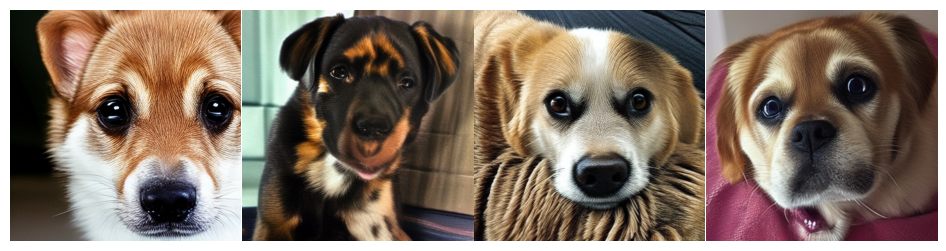

In [29]:
pipe.unet = cm_unet.eval().to(torch.float16)

generator = torch.Generator(device="cuda").manual_seed(0)
guidance_scale = 0

images = consistency_sampling(
    pipe,
    [prompt],
    num_inference_steps=4,
    generator=generator,
    num_images_per_prompt=4,
    guidance_scale=guidance_scale
)

visualize_images(images)

And we get nice images in 4 steps

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

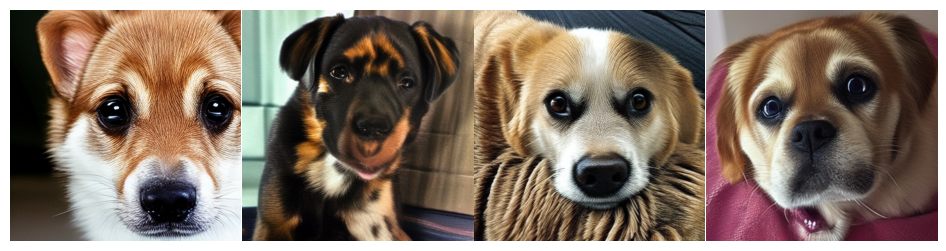

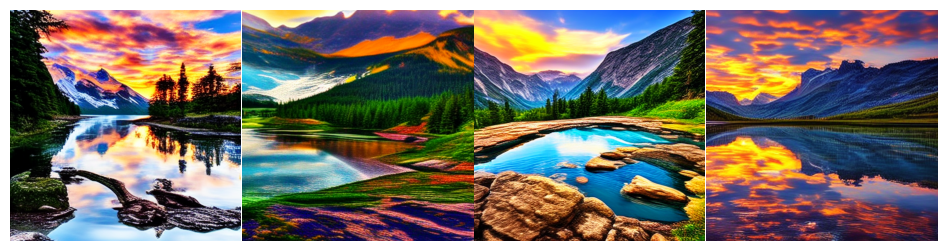

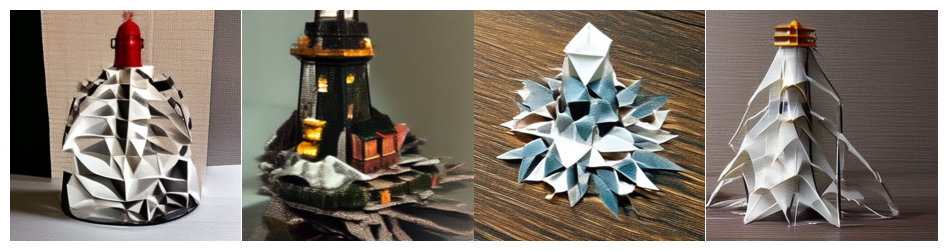

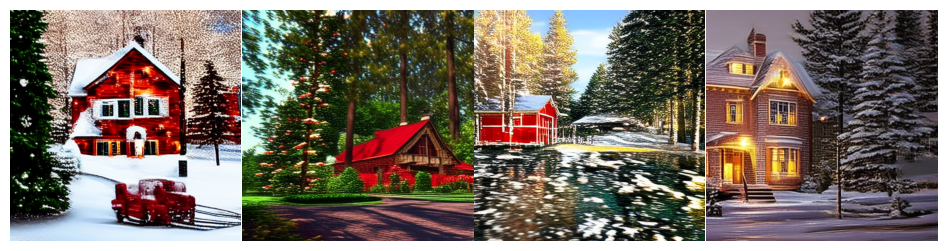

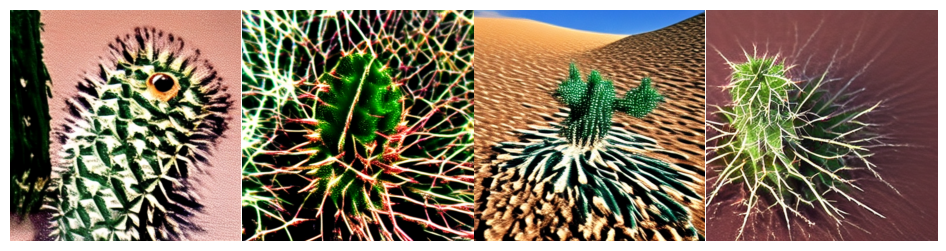

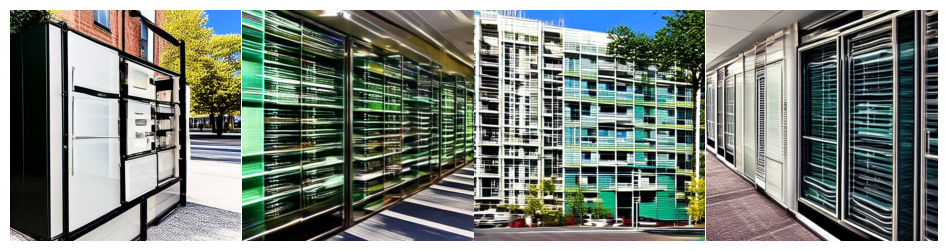

In [31]:
validation_prompts = [
    "A sad puppy with large eyes",
    "A photo of beautiful mountain with realistic sunset and blue lake, highly detailed, masterpiece",
    "A lighthouse in a giant wave, origami style",
    "belle epoque, christmas, red house in the forest, photo realistic, 8k",
    "A small cactus with a happy face in the Sahara desert",
    "Green commercial building with refrigerator and refrigeration units outside",
]

for prompt in validation_prompts:
    generator = torch.Generator(device="cuda").manual_seed(0)

    images = consistency_sampling(
        pipe,
        [prompt],
        num_inference_steps=4,
        generator=generator,
        num_images_per_prompt=4,
        guidance_scale=guidance_scale
    )

    visualize_images(images)

And we also get nice images for other prompts

# Multi-boundary Сonsistency Distillation (3rd approach)

This is a modification where we calculate loss at the certain boundary steps on our latent space denoising trajectories instead of leaping to step 0 from everywhere.

described [here](https://arxiv.org/pdf/2403.06807)

In [32]:
def get_multi_boundary_timesteps(
    timesteps,
    num_boundaries=4,
    num_timesteps=1000,
):
    # timesteps -> boundaries. we want [0, 499)->0 and [499, 999)->499 for num_boundaries==2
    num_boundary = torch.clamp( (timesteps + 1) * num_boundaries // num_timesteps, max = num_boundaries-1)
    boundary_timesteps = torch.clamp(num_boundary * num_timesteps // num_boundaries - 1 , min=0, max=num_timesteps )
    return boundary_timesteps

In [33]:
unet = unet.to(torch.float32)
unet.train()
assert unet.dtype == torch.float32

# new set of LoRA adapters
cm_unet.add_adapter("multi-cd", lora_config)
cm_unet.set_adapter("multi-cd")

optimizer = torch.optim.AdamW(cm_unet.parameters(), lr=0.3e-4)

In [34]:
multi_cd_loss = functools.partial(
    cm_loss_template,

    loss_fn=pseudo_huber_loss,
    get_boundary_timesteps=get_multi_boundary_timesteps,
    get_xs_from_xt=get_xs_from_xt_with_teacher
)
assert cm_unet.active_adapter == 'multi-cd'

**Training  the Multi-boundary CD model**

In [35]:
num_grad_accum = 2 # 1 optimizer step per 2 batches

train_loop(cm_unet, pipe, train_dataloader, optimizer, multi_cd_loss, num_grad_accum)

  0%|          | 0/750 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

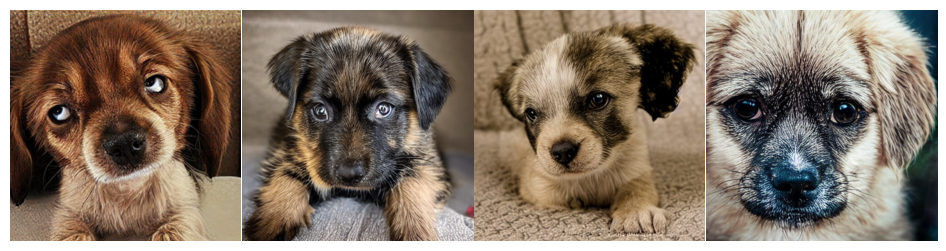

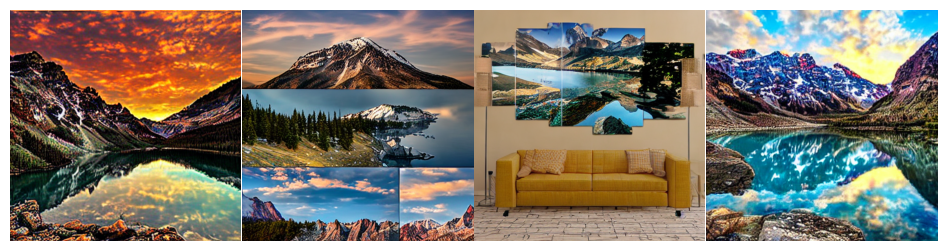

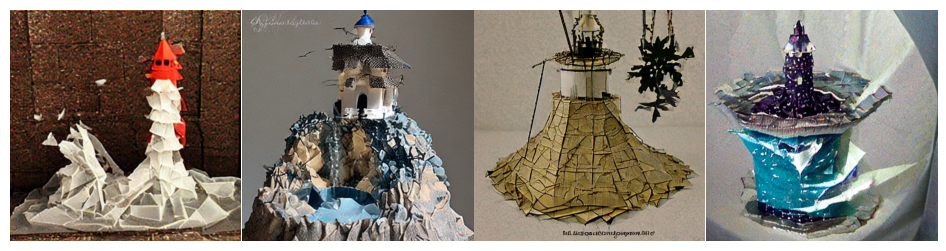

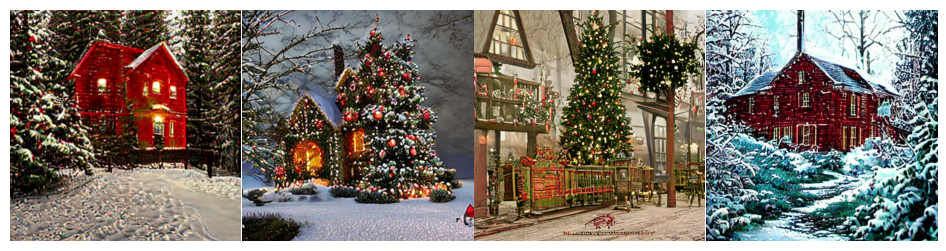

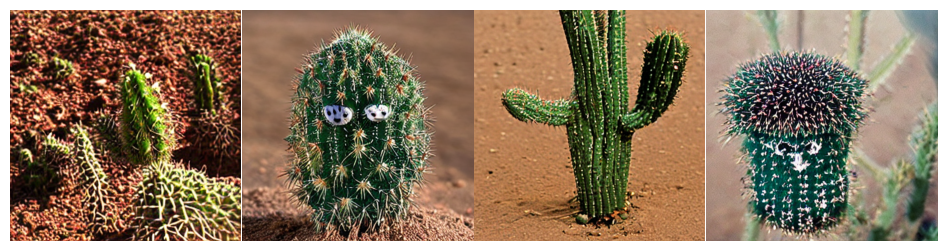

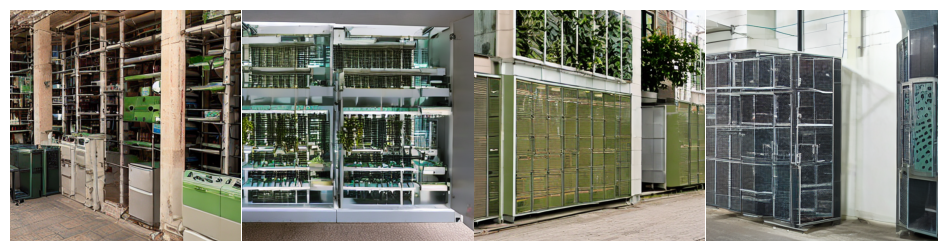

In [36]:
pipe.unet = cm_unet.eval().to(torch.float16)

guidance_scale = 1

for prompt in validation_prompts:
    generator = torch.Generator(device="cuda").manual_seed(1)

    images = pipe(
            [prompt],
            generator=generator,
            num_inference_steps = num_inference_steps,
            guidance_scale = guidance_scale,
            num_images_per_prompt = 4
          ).images
    
    visualize_images(images)

And those are even nicer